In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
#https://scipython.com/blog/quadtrees-2-implementation-in-python/
#https://pydoc.net/openslide-python/1.1.1/openslide/

import numpy as np
import openslide
from probreg import cpd
from probreg import transformation as tf
import cv2
from PIL import Image
from pathlib import Path
import pandas as pd
from tqdm import tqdm
import json

import pickle

In [3]:
#!pip install  -i https://test.pypi.org/simple/ qt-wsi-registration==0.0.3
import qt_wsi_reg.registration_tree as registration

In [4]:
source_slide_paths = list(Path(r"D:\Datasets\ScannerStudy\Aperio\CCMCT").glob("*.svs"))

if len(source_slide_paths) == 0:
    source_slide_paths = list(Path(r"/data/ScannerStudy/Aperio/CCMCT").glob("*.svs"))

len(source_slide_paths)

5

In [5]:
target_slide_paths = list(Path(r"D:\Datasets\ScannerStudy\Aperio\CCMCT").glob("*.svs")) 

if len(target_slide_paths) == 0:
    target_slide_paths = list(Path(r"/data/ScannerStudy/Aperio/CCMCT").glob("*.svs"))

len(target_slide_paths)

5

In [6]:
source_slide_paths = {name.stem.split("_")[-2] : 
                      {"name": name, "slide": openslide.OpenSlide(str(name))}
                      for name in source_slide_paths}
source_slide_paths.keys()

dict_keys(['518711B', '183715A', '29609B', '380609B', '22108'])

In [7]:
target_slide_paths = {name.stem.split("_")[-2] : 
                      {"name": name, "slide": openslide.OpenSlide(str(name))}
                      for name in target_slide_paths}
target_slide_paths.keys()

dict_keys(['518711B', '183715A', '29609B', '380609B', '22108'])

In [8]:
for name in source_slide_paths:
    if name not in target_slide_paths:
        print(name)

In [9]:
for name in target_slide_paths:
    if name not in source_slide_paths:
        print(name)

In [13]:
#for name, source in source_slide_paths.items():
    
#    source_slide = source["slide"]
    
#source_slide.properties

<_PropertyMap {'aperio.AppMag': '40', 'aperio.DSR ID': '130.133.91.37', 'aperio.Date': '03/15/17', 'aperio.DisplayColor': '0', 'aperio.Exposure Scale': '0.000001', 'aperio.Exposure Time': '109', 'aperio.Filename': 'MCT Mitose 2017-026', 'aperio.Focus Offset': '0.000000', 'aperio.ICC Profile': 'ScanScope v1', 'aperio.ImageID': '10658', 'aperio.Left': '16.489124', 'aperio.LineAreaXOffset': '0.003040', 'aperio.LineAreaYOffset': '-0.011652', 'aperio.LineCameraSkew': '-0.000450', 'aperio.MPP': '0.2533', 'aperio.OriginalHeight': '83894', 'aperio.OriginalWidth': '110400', 'aperio.ScanScope ID': 'VETWE12MIC', 'aperio.SessonMode': 'NR', 'aperio.StripeWidth': '1840', 'aperio.Time': '22:24:33', 'aperio.Time Zone': 'GMT+01:00', 'aperio.Title': '5187_11_B_1_MCT Mitose 2017', 'aperio.Top': '22.481018', 'aperio.User': '2d31be96-b4be-46ff-95da-d55fbe6186fb', 'openslide.comment': 'Aperio Image Library v12.0.15 \r\n110400x83894 [0,100 107999x83794] (240x240) J2K/KDU Q=70|AppMag = 40|StripeWidth = 1840|S

In [10]:
def add_help_fields(frame):
    
    frame["image_name_stem"] = [Path(image_name).stem for image_name in frame["image_name"]]
    
    frame["patient_id"] = [name.split("_")[2] for name in frame["image_name"]]

    frame["x1"] = [json.loads(vector.replace("\'","\""))['x1'] for vector in frame["vector"]]
    frame["y1"] = [json.loads(vector.replace("\'","\""))['y1'] for vector in frame["vector"]]

    frame["x2"] = [json.loads(vector.replace("\'","\""))['x2'] for vector in frame["vector"]]
    frame["y2"] = [json.loads(vector.replace("\'","\""))['y2'] for vector in frame["vector"]]

    frame["center_x"] = [x1 + ((x2-x1) / 2) for x1, x2 in zip(frame["x1"], frame["x2"])]
    frame["center_y"] = [y1 + ((y2-y1) / 2) for y1, y2 in zip(frame["y1"], frame["y2"])]
    
    frame["center"] = [np.array((center_x, center_y)) for center_x, center_y in zip(frame["center_x"], frame["center_y"])]

    frame["anno_width"] = [x2-x1 for x1, x2 in zip(frame["x1"], frame["x2"])]
    frame["anno_height"]= [y2-y1 for y1, y2 in zip(frame["y1"], frame["y2"])]
    
    return frame

landmarks = add_help_fields(pd.read_csv("../Validation/4Scanner/GT.csv"))
landmarks.head()

,scanner,image_id,image_name,image_type,image_width,image_height,id,vector,unique_identifier,annotation_type,...,patient_id,x1,y1,x2,y2,center_x,center_y,center,anno_width,anno_height
0,2.0HT,10410,N2_CCMCT_380609B_1.ndpi,CCMCT,147456,107008,2755406,"{'x1': 20354, 'x2': 20408, 'y1': 16752, 'y2': ...",95183f6e-0a00-4de4-9c97-fedfec655a27,384,...,380609B,20354,16752,20408,16806,20381.0,16779.0,"[20381.0, 16779.0]",54,54
1,2.0HT,10410,N2_CCMCT_380609B_1.ndpi,CCMCT,147456,107008,2755407,"{'x1': 20256, 'x2': 20310, 'y1': 35448, 'y2': ...",cc3def2b-5631-4619-ab08-51f2a69c667d,385,...,380609B,20256,35448,20310,35502,20283.0,35475.0,"[20283.0, 35475.0]",54,54
2,2.0HT,10410,N2_CCMCT_380609B_1.ndpi,CCMCT,147456,107008,2755408,"{'x1': 20445, 'x2': 20499, 'y1': 54139, 'y2': ...",2d3de917-e55a-470f-8af2-10eb49b69687,386,...,380609B,20445,54139,20499,54193,20472.0,54166.0,"[20472.0, 54166.0]",54,54
3,2.0HT,10410,N2_CCMCT_380609B_1.ndpi,CCMCT,147456,107008,2755409,"{'x1': 26495, 'x2': 26549, 'y1': 71854, 'y2': ...",611f9d35-6cdb-42ef-bc38-2f44c9aaa257,387,...,380609B,26495,71854,26549,71908,26522.0,71881.0,"[26522.0, 71881.0]",54,54
4,2.0HT,10410,N2_CCMCT_380609B_1.ndpi,CCMCT,147456,107008,2755410,"{'x1': 35443, 'x2': 35497, 'y1': 90091, 'y2': ...",bf3ef0d3-5153-4693-96ba-96047cb3ae24,388,...,380609B,35443,90091,35497,90145,35470.0,90118.0,"[35470.0, 90118.0]",54,54


In [11]:
%%time

results = {}
#target_depth = 2

for thumbnail_size in [(2048, 2048)]: #(1024, 1024), (2048, 2048), (4096, 4096)
    
    for target_depth in [1]: # 0, 2
        
        result_folder = Path(f"Depth_{target_depth}/{thumbnail_size[0]}")

        result_folder.mkdir(parents=True, exist_ok=True)
    
        for name, source in source_slide_paths.items():

            parameter = {
                # feature extractor parameters
                "point_extractor": "sift",  #orb , sift
                "maxFeatures": 512, 
                "crossCheck": False, 
                "flann": False,
                "ratio": 0.5, 
                "use_gray": False,

                # QTree parameter 
                "homography": True,
                "filter_outliner": False,
                "debug": True,
                "target_depth": target_depth,
                "run_async": True,
                "thumbnail_size": thumbnail_size
            }

            target = target_slide_paths[name]


            source_slide = source["slide"]
            target_slide = target["slide"]
            
            soure_path = source["name"]
            targert_path = target["name"]

            source_dimension = registration.Rect.create(registration.Rect, 0, 0, source_slide.dimensions[0], source_slide.dimensions[1])
            target_dimension = registration.Rect.create(registration.Rect, 0, 0, target_slide.dimensions[0], target_slide.dimensions[1])

            qtree = registration.RegistrationQuadTree(source_slide_path=soure_path, target_slide_path=targert_path, **parameter)

            results[source["name"]] = qtree
            
            #with open(result_folder / f'{qtree.source_name}-To-{qtree.target_name}.pickle', 'wb') as handle:
            #    pickle.dump(qtree, handle, protocol=pickle.HIGHEST_PROTOCOL)

CPU times: user 13min 37s, sys: 19.6 s, total: 13min 57s
Wall time: 1min 49s


/home/bronzi/env/EIPH_WSI/lib/python3.8/site-packages/qt_wsi_reg/registration_tree.py:603: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(constrained_layout=True, figsize=figsize)


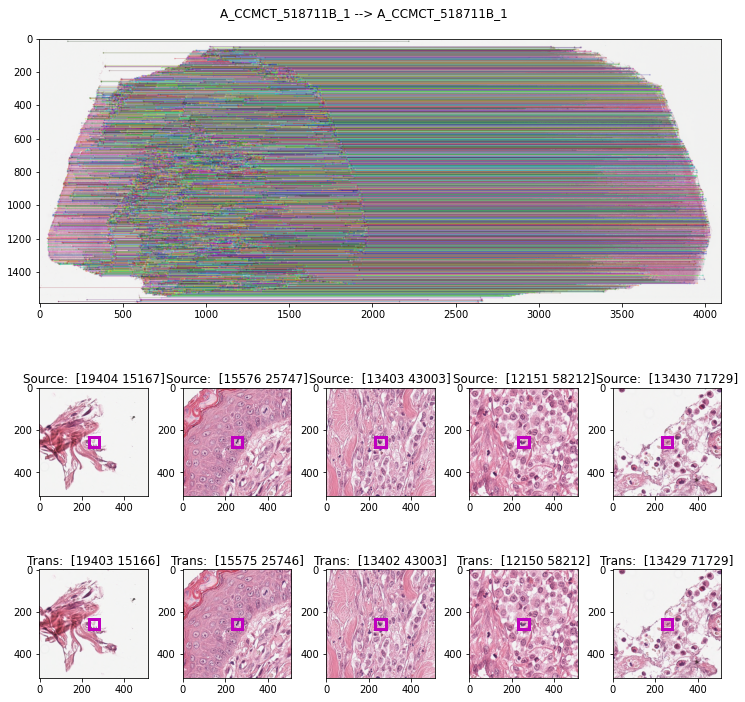

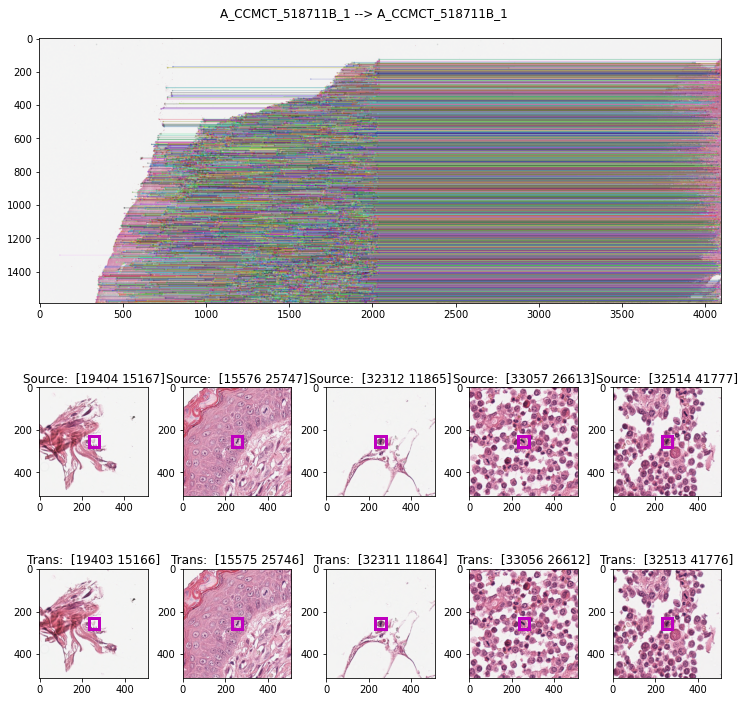

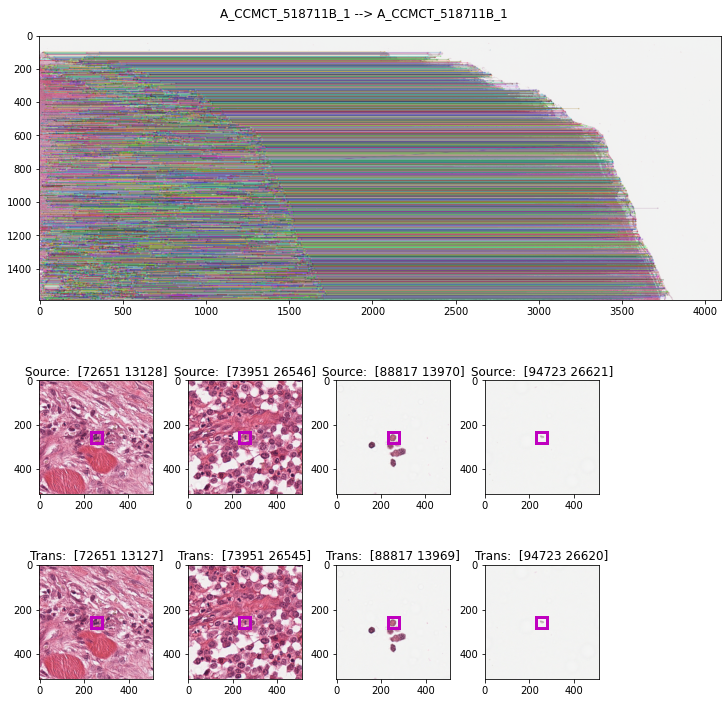

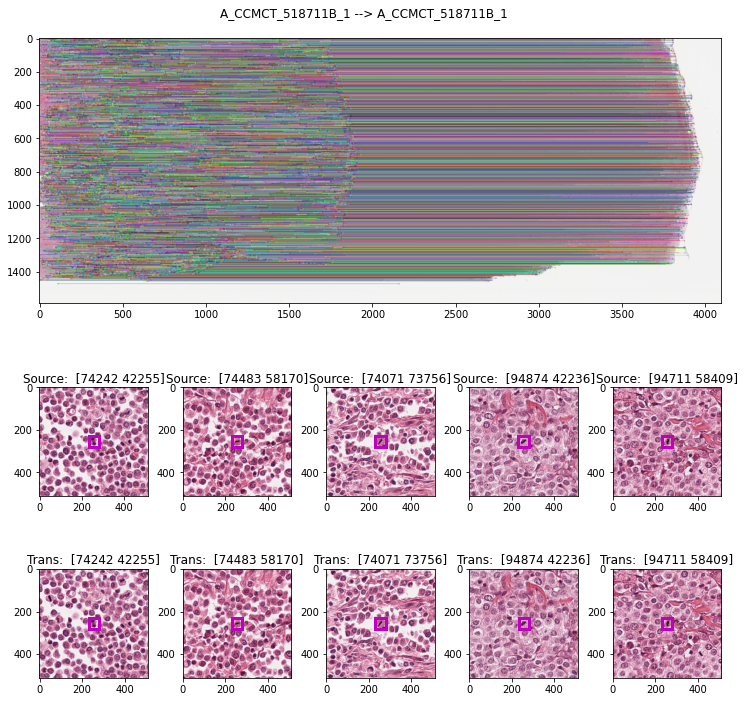

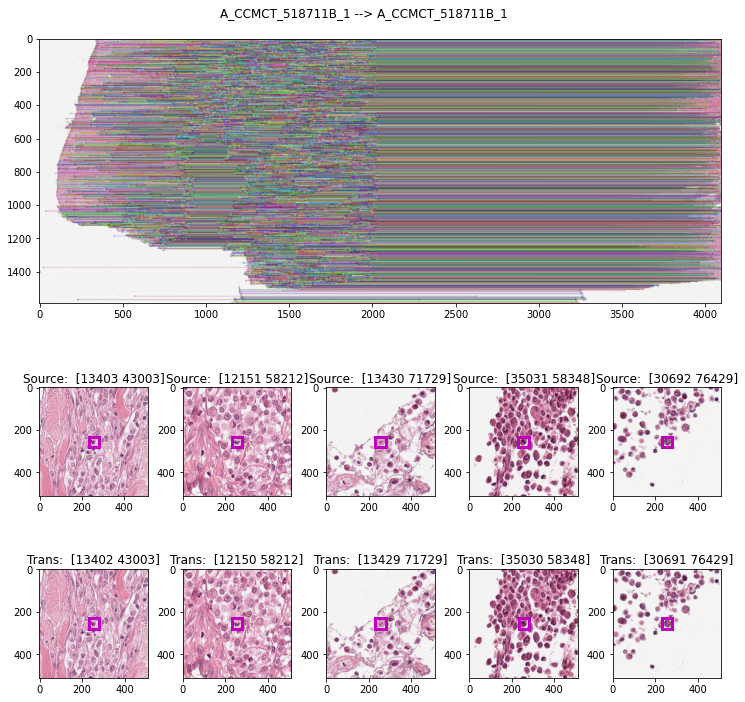

...

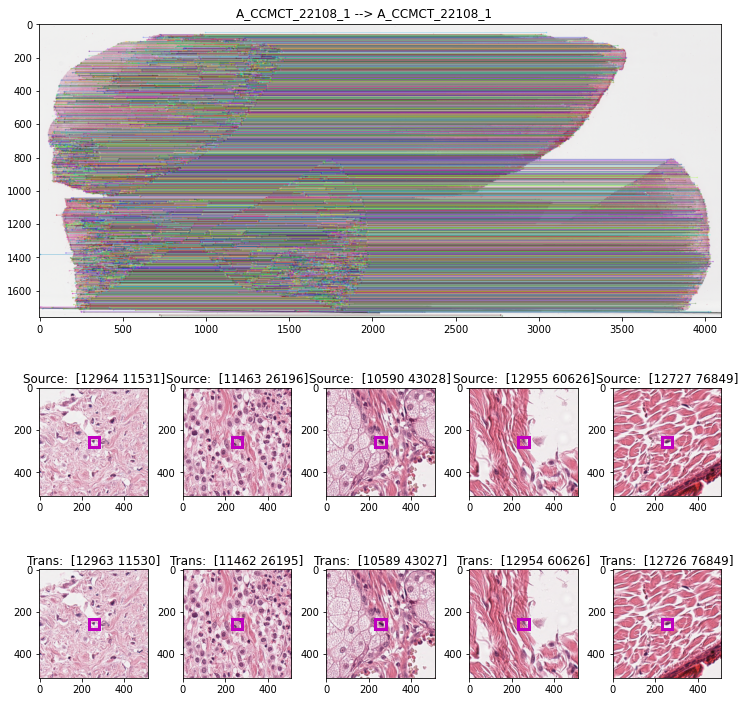

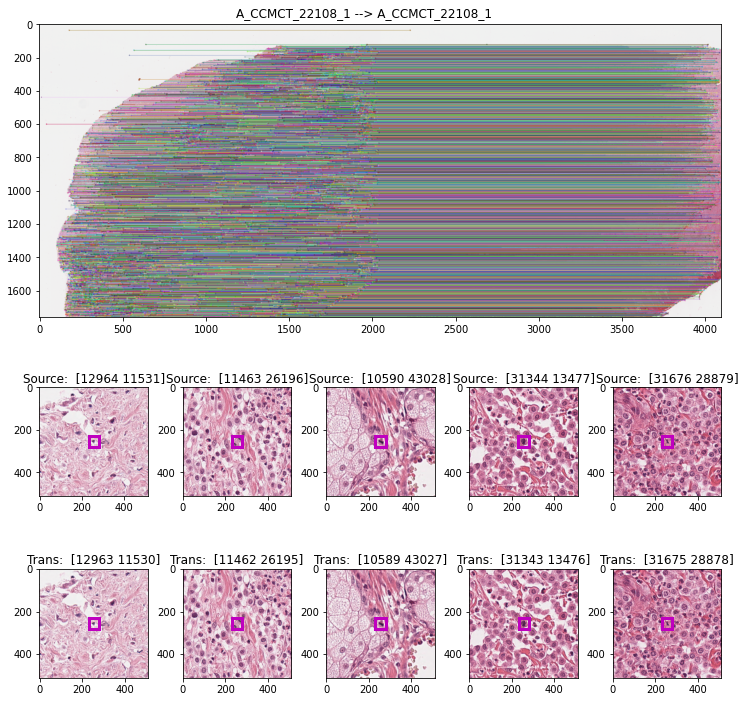

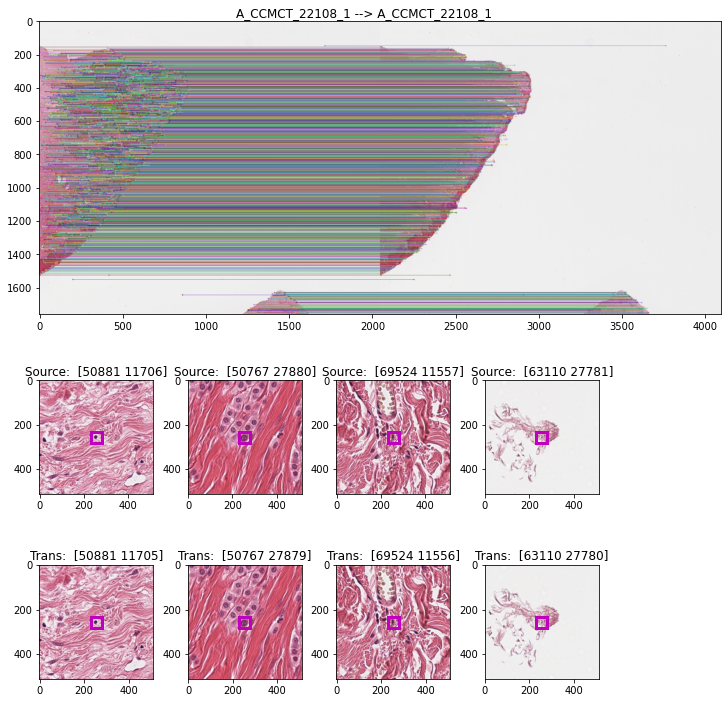

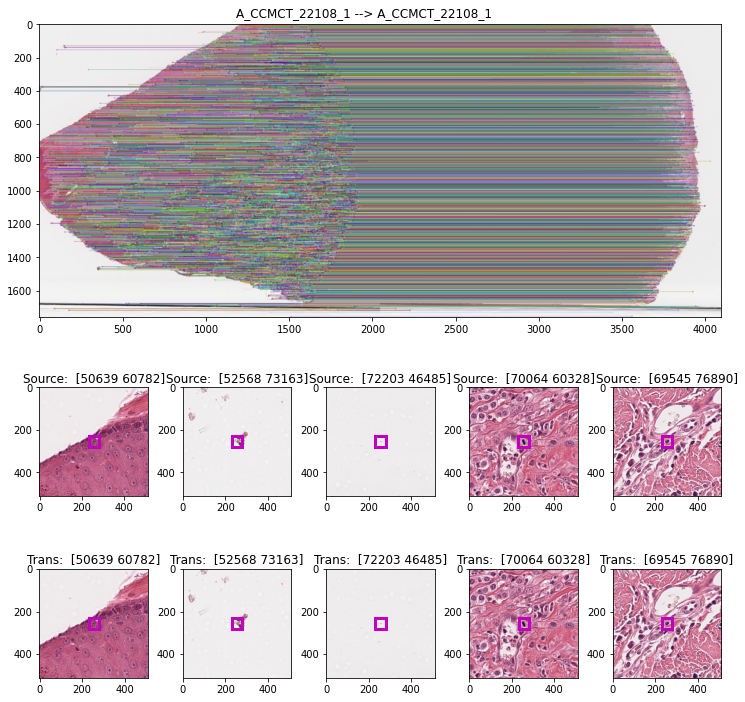

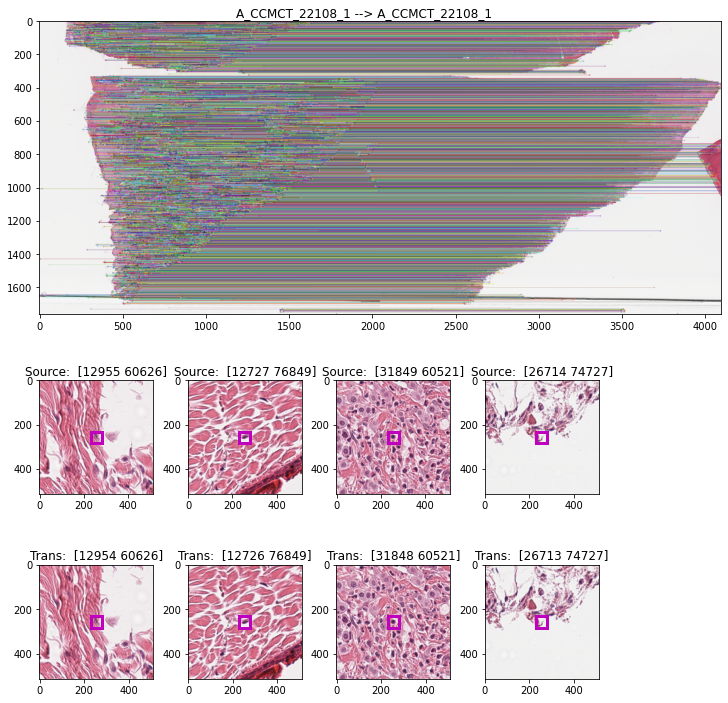

In [13]:
for path, qtree in results.items():
    
    #if qtree.target_depth != 2:
    #    continue
    
    df_gt = landmarks[landmarks["image_name"] == path.name]#.sample(n=5, random_state=1)
    
    annos = np.array(df_gt[["center_x", "center_y", "anno_width", "anno_height"]]) 
    result, _ = qtree.draw_annotations(annos, num_sub_pic=5, figsize=(10, 10))
    
    Path("RegResults").mkdir(exist_ok=True)
    result.savefig(f'RegResults/{qtree.source_slide_path.stem}_{qtree.target_slide_path.stem}.pdf')

In [15]:
for path, qtree in results.items():

    print(qtree)

Source: A_CCMCT_518711B_1 
Target: A_CCMCT_518711B_1 
Source: (-0.50, 0.00, 107998.50, 83794.00) Target: (-0.50, 0.00, 107998.50, 83794.00)
x: [1.000, -0.000, 0.000], y: [0.000, 1.000, 0.000]] error: 0.000
nw: Source: (-0.50, 0.00, 53999.00, 41897.00) Target: (-0.50, -0.50, 53998.50, 41896.50)
  x: [1.000, 0.000, -0.000], y: [-0.000, 1.000, -0.000]] error: 0.000
ne: Source: (53999.00, 0.00, 107998.50, 41897.00) Target: (53998.25, -0.50, 107997.75, 41896.50)
  x: [1.000, 0.000, 1.005], y: [-0.000, 1.000, 0.015]] error: 0.970
se: Source: (53999.00, 41897.00, 107998.50, 83794.00) Target: (53998.25, 41896.50, 107997.75, 83793.50)
  x: [1.000, 0.000, 1.006], y: [-0.000, 1.000, 1.037]] error: 0.721
sw: Source: (-0.50, 41897.00, 53999.00, 83794.00) Target: (-0.50, 41896.50, 53998.50, 83793.50)
  x: [1.000, 0.000, -0.017], y: [-0.000, 1.000, 1.045]] error: 0.565
Source: A_CCMCT_183715A_1 
Target: A_CCMCT_183715A_1 
Source: (-0.50, 0.00, 77398.50, 66558.00) Target: (-0.50, 0.00, 77398.50, 66558